# The Stakeholder
Zachary Brooks
Seller
### Invests in historical houses, best neighborhoods, high profits, best timing within a year, should renovate?

## Questions
- Where are the oldest houses?
- How long have the houses been with the current owner?
- What are the houses in the neigbourhood valued at?
- What is the best month to buy?
- What is the best time of year to sell?


## Hypothesis
- Houses at the waterfront are more expensive
- Houses which have not been renovated in the last 10 years are cheaper



- Recently deceased owners => Old houses, without recent renovation in more expensive neighborhood



|Question   |  Hypothesis |  Indicator |
|---|---|---|
| Where are the oldest houses?  | Mostly near the water  |  Build date, geolocation |   
| How does age affect the house price?  |  Positive, if well maintained  | Renovation date  |  
|   |  Negative, if too small | Squarefootage |  
|  What is the best month for buying cheap?  |  Probably winter, because houses look less appealing to other buyers. | Selling date, price difference to similar houses in neighborhood  |  


|Question   |  Hypothesis |  Indicator |
|---|---|---|
| Where are the oldest houses worth most?          | Mostly near the water                                           |  Build date, geolocation |   
| How does age affect the house price?  |  Positive, if well maintained                                   | Renovation date  |  
|                                       |  Negative, if too small                                         | Squarefootage |  
|  When is the best time to sell?       |  Probably summer, because houses look more appealing to buyers. | Selling date, price difference to similar houses in neighborhood  |  
|  How important is renovating?     |  Renovating increases price                                     | Renovation date, relative price  |  
|                                       |  Renovation is more important in old houses  


Recommendations:
- look there for old houses
- best to buy/sell old houses with size = x or higher/smaller
- renovate if has been more than x years, because renovation is more valuable in old houses?
- or: don't renovate: because houses in original state are worth more (if condition is good)


# Assumptions
- Historical houses were built before the economic boom in the 1950s




# Package Install

In [1]:
import warnings

warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(rc = {'figure.figsize':(14,8),"axes.facecolor" : "white", "axes.edgecolor":  "black"})
from matplotlib.ticker import PercentFormatter
plt.rcParams["figure.facecolor"]= "w"
pd.plotting.register_matplotlib_converters()
pd.set_option('display.float_format', lambda x: '%.3f' % x)

import plotly.express as px
from datetime import datetime, date, time, timedelta

from scipy.stats.mstats import winsorize

In [110]:
def renovated(dataframe):
    return dataframe[dataframe["yr_renovated"] > 0]

def not_renovated(dataframe):
    return dataframe[dataframe["yr_renovated"] == 0]

def old(dataframe, yr= 1939):
    return dataframe[dataframe["yr_built"] < yr]

def new(dataframe, yr=1939):
    return dataframe[dataframe["yr_built"] >= yr]

def water(dataframe):
    return dataframe[dataframe["waterfront"] == 1]

def binby(dataframe, column, bins=20, lab = True):
    nbins = bins
    bin_borders = np.arange(dataframe[column].min()*(1-nbins/100), dataframe[column].max()*(1+nbins/100), (dataframe[column].max()-dataframe[column].min())/nbins)
    if lab == False:
        binned_column = pd.cut(dataframe[column], bins= bin_borders, labels = lab)
    else:
        binned_column = pd.cut(dataframe[column], bins= bin_borders, labels = bin_borders[:-1])
    binned_column.name = column+"_bin"
    return pd.concat([dataframe, binned_column], axis=1)

# Data Import and Overview

In [111]:
df= pd.read_csv("data/King_County_House_prices_dataset.csv")
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,NaN,0.000,...,7,1180,0.0,1955,0.000,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,7,2170,400.0,1951,1991.000,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,6,770,0.0,1933,NaN,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,7,1050,910.0,1965,0.000,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,8,1680,0.0,1987,0.000,98074,47.617,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.000,3,2.500,1530,1131,3.000,0.000,0.000,...,8,1530,0.0,2009,0.000,98103,47.699,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.000,4,2.500,2310,5813,2.000,0.000,0.000,...,8,2310,0.0,2014,0.000,98146,47.511,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.000,2,0.750,1020,1350,2.000,0.000,0.000,...,7,1020,0.0,2009,0.000,98144,47.594,-122.299,1020,2007
21595,291310100,1/16/2015,400000.000,3,2.500,1600,2388,2.000,NaN,0.000,...,8,1600,0.0,2004,0.000,98027,47.535,-122.069,1410,1287


In [112]:
df.shape

(21597, 21)

# Transformation of Dataframe

Check for NaN

In [113]:
df_null= df.isnull()
#sns.heatmap(df_null)

## Replacing missing Values

In [114]:
df.yr_renovated = df["yr_renovated"].fillna(-1)
df_null= df.isnull()
#sns.heatmap(df_null)

Convert date to datetime and create column for "month" 

In [115]:
df.date = pd.to_datetime(df.date)
df["month"] = df.date.dt.month

### Binning

In [116]:
df = binby(df, "price", 20)
df = binby(df, "sqft_living", 20)
df = binby(df, "yr_built", 20)


Average price of houses in same area and same size

In [117]:
df["price_of_same_size_and_loc"] = df.groupby(["zipcode","sqft_living_bin", "yr_built"])["price"].transform("mean")
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,month,price_bin,sqft_living_bin,yr_built_bin,price_of_same_size_and_loc
0,7129300520,2014-10-13,221900.000,3,1.000,1180,5650,1.000,NaN,0.000,...,98178,47.511,-122.257,1340,5650,10,62400.000,954.500,1951.250,221900.000
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,98125,47.721,-122.319,1690,7639,12,443500.000,2271.500,1945.500,538000.000
2,5631500400,2015-02-25,180000.000,2,1.000,770,10000,1.000,0.000,0.000,...,98028,47.738,-122.233,2720,8062,2,62400.000,296.000,1928.250,180000.000
3,2487200875,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0.000,0.000,...,98136,47.521,-122.393,1360,5000,12,443500.000,1613.000,1962.750,604000.000
4,1954400510,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0.000,0.000,...,98074,47.617,-122.045,1800,7503,2,443500.000,1613.000,1985.750,548645.231
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,2014-05-21,360000.000,3,2.500,1530,1131,3.000,0.000,0.000,...,98103,47.699,-122.346,1530,1509,5,62400.000,954.500,2008.750,403261.250
21593,6600060120,2015-02-23,400000.000,4,2.500,2310,5813,2.000,0.000,0.000,...,98146,47.511,-122.362,1830,7200,2,62400.000,2271.500,2008.750,423122.800
21594,1523300141,2014-06-23,402101.000,2,0.750,1020,1350,2.000,0.000,0.000,...,98144,47.594,-122.299,1020,2007,6,62400.000,954.500,2008.750,398214.429
21595,291310100,2015-01-16,400000.000,3,2.500,1600,2388,2.000,NaN,0.000,...,98027,47.535,-122.069,1410,1287,1,62400.000,954.500,2003.000,372000.000


In [118]:
df.groupby(["zipcode","sqft_living_bin", "yr_built"]).count()

id  date  price  bedrooms  bathrooms  \
zipcode sqft_living_bin yr_built                                         
98001   296.0           1900       0     0      0         0          0   
                        1901       0     0      0         0          0   
                        1902       0     0      0         0          0   
                        1903       0     0      0         0          0   
                        1904       0     0      0         0          0   
...                               ..   ...    ...       ...        ...   
98199   15441.5         2011       0     0      0         0          0   
                        2012       0     0      0         0          0   
                        2013       0     0      0         0          0   
                        2014       0     0      0         0          0   
                        2015       0     0      0         0          0   

                                  sqft_living  sqft_lot  floors  waterfront  \
zipcode sqft_living_bin yr_built                                              
98001   296.0           1900                0         0       0           0   
                        1901                0         0       0           0   
                        1902                0         0       0           0   
                        1903                0         0       0           0   
                        1904                0         0       0           0   
...                                       ...       ...     ...         ...   
98199   15441.5         2011                0         0       0           0   
                        2012                0         0       0           0   
                        2013                0         0       0           0   
                        2014                0         0       0           0   
                        2015                0         0       0           0   

                                  view  ...  sqft_basement  yr_renovated  lat  \
zipcode sqft_living_bin yr_built        ...                                     
98001   296.0           1900         0  ...              0             0    0   
                        1901         0  ...              0             0    0   
                        1902         0  ...              0             0    0   
                        1903         0  ...              0             0    0   
                        1904         0  ...              0             0    0   
...                                ...  ...            ...           ...  ...   
98199   15441.5         2011         0  ...              0             0    0   
                        2012         0  ...              0             0    0   
                        2013         0  ...              0             0    0   
                        2014         0  ...              0             0    0   
                        2015         0  ...              0             0    0   

                                  long  sqft_living15  sqft_lot15  month  \
zipcode sqft_living_bin yr_built                                           
98001   296.0           1900         0              0           0      0   
                        1901         0              0           0      0   
                        1902         0              0           0      0   
                        1903         0              0           0      0   
                        1904         0              0           0      0   
...                                ...            ...         ...    ...   
98199   15441.5         2011         0              0           0      0   
                        2012         0              0           0      0   
                        2013         0              0           0      0   
                        2014         0              0           0      0   
                        2015         0              0           0      0   



<AxesSubplot:xlabel='price', ylabel='price_bin'>

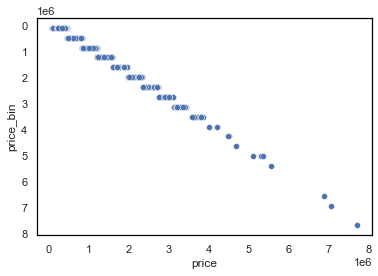

In [119]:
sns.scatterplot(data= df, x="price", y="price_bin")

<AxesSubplot:xlabel='sqft_living', ylabel='sqft_living_bin'>

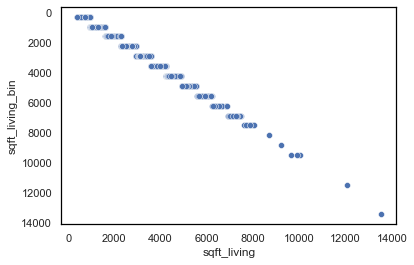

In [120]:
sns.scatterplot(data= df, x="sqft_living", y="sqft_living_bin")

<AxesSubplot:xlabel='yr_built', ylabel='yr_built_bin'>

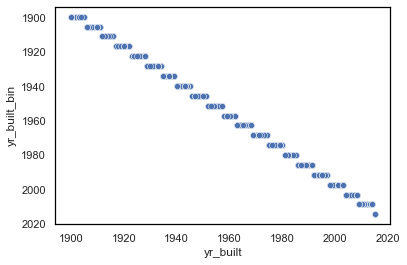

In [121]:
sns.scatterplot(data= df, x="yr_built", y="yr_built_bin")

Add column with "Relative size" (compared to 15 Neighbors)

In [122]:
df["relative_size"] = df.sqft_living / df.sqft_living15

Add column "neighborhood price" (Average price of all houses in zipcode) - Winsorized Mean excluding 1% most expensive houses

In [123]:
#df["neighborhood_price_mean"] = df.groupby("zipcode")["price"].transform("mean")
df["neighborhood_price_win"] = df.groupby("zipcode")["price"].transform(lambda x: np.mean(winsorize(x, limits=[0,0.01], inclusive= (True, True))))

In [124]:
df["relative_price_win"] = df["price"] / df["neighborhood_price_win"]

Add column with price, relative to similar size and location

In [125]:
df["relative_price_bin"] = df["price"] / df["price_of_same_size_and_loc"]

Add colum "Years since renovation" (gives years since built for unrenovated houses)

In [126]:
renovated_houses = renovated(df)
renovated_houses["yr_since_reno"] = 2015- df.yr_renovated
not_renovated = not_renovated(df)
not_renovated["yr_since_reno"]= 2015 - not_renovated.yr_built
unknown_reno = df[df["yr_renovated"]==-1]
unknown_reno["yr_since_reno"] = np.nan
df = pd.concat([renovated_houses, not_renovated, unknown_reno], axis = 0)

Bin years since renovated

In [127]:
bin_borders = np.arange(0, 121, 10)
binned_column = pd.cut(df["yr_since_reno"], bins= bin_borders, labels = bin_borders[:-1])
binned_column.name = "yr_since_reno_bin"
df =  pd.concat([df, binned_column], axis=1)

Add Old/Young classifier

In [140]:
antiques =  old(df)[["id","date"]]
antiques["age"] = "antique"
moderns =  new(df)[["id","date"]]
moderns["age"] = "modern"
labelled_age= pd.concat([antiques, moderns])
df= pd.merge(df, labelled_age[["id","age"]], on="id")

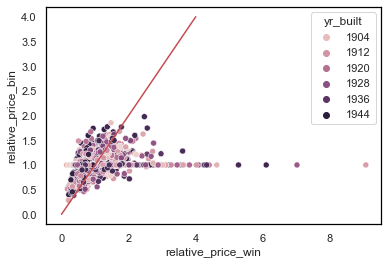

In [40]:
sns.scatterplot(data= old(df), x="relative_price_win", y= "relative_price_bin", hue = "yr_built")
X_plot = np.linspace(0, 4, 2)
Y_plot = np.linspace(0, 4, 2)
plt.plot(X_plot, Y_plot, color='r')

Text(1980000.0, 7000, '99th Percentile')

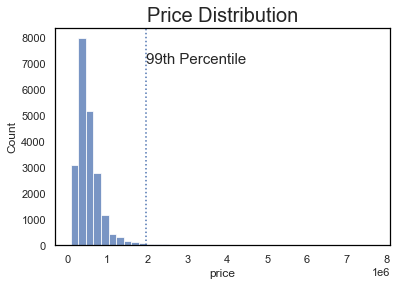

In [41]:
sns.histplot(data= df, x="price", bins=40).set_title('Price Distribution', fontsize=20)
plt.axvline(df.price.quantile(0.99), linestyle = ":")
plt.text(df.price.quantile(0.99)+0.01e6, 7000, "99th Percentile", size = 15)

Add column "Relative price" (compared to houses in same zipcode)

# Data Exploration

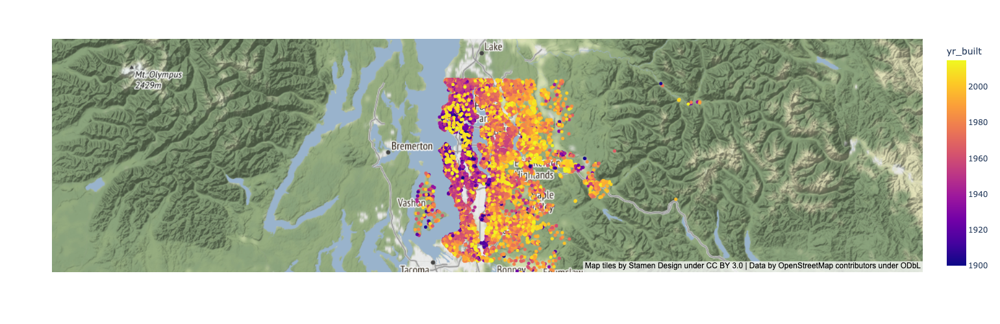

In [42]:
locations = px.scatter_mapbox(df, lat=df.lat, lon = df.long, color=df.yr_built, mapbox_style ="stamen-terrain", zoom =8, width = 800, height=500)
locations.show()

Text(0.5, 1.0, 'Building Date distribution')

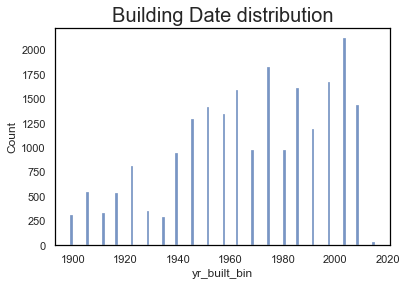

In [45]:
sns.histplot(data= df, x="yr_built_bin", bins=5).set_title('Building Date distribution', fontsize=20)

Text(0.5, 1.0, 'Building Date distribution')

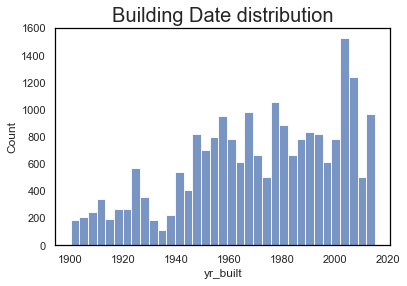

In [46]:
sns.histplot(data= df, x="yr_built").set_title('Building Date distribution', fontsize=20)

Text(0.5, 1.0, 'Renovation date')

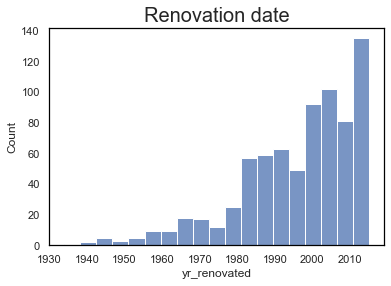

In [47]:
sns.histplot(data= renovated(df), x="yr_renovated").set_title('Renovation date', fontsize=20)

Text(0.5, 1.0, 'Years since renovation')

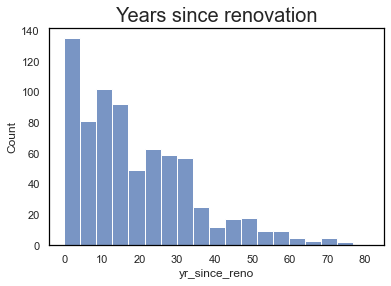

In [48]:
sns.histplot(data= renovated(df), x="yr_since_reno").set_title('Years since renovation', fontsize=20)

[Text(0.5, 1.0, 'Old houses - Years since last renovation ')]

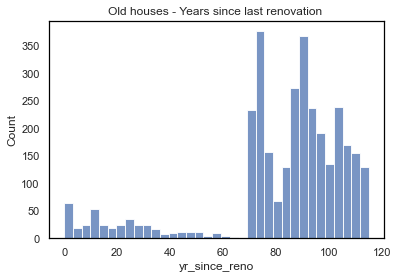

In [49]:
sns.histplot(data= old(df), x="yr_since_reno").set(title='Old houses - Years since last renovation ')

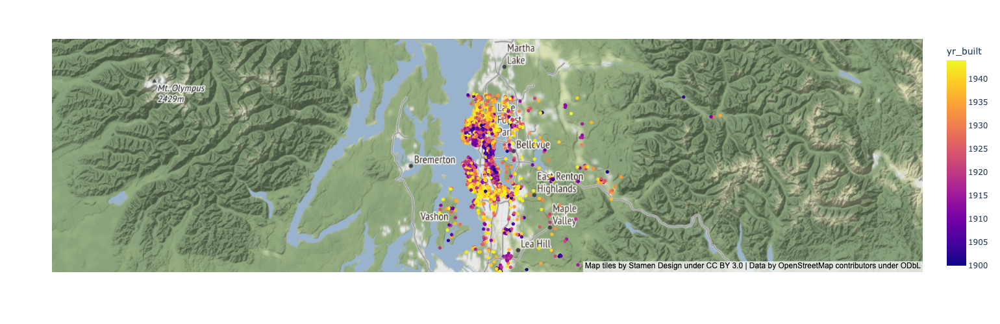

In [50]:
locations = px.scatter_mapbox(old(df), lat="lat", lon = "long", color="yr_built", mapbox_style ="stamen-terrain", zoom =8, width = 800, height=500)
locations.show()

In [ ]:
locations = px.scatter_mapbox(old(df,2000), lat="lat", lon = "long", color="relative_size", mapbox_style ="stamen-terrain", zoom =8, width = 800, height=500, color_continuous_scale=px.colors.diverging.RdBu, range_color= [0,2], color_continuous_midpoint = 1)
locations.show()

In [ ]:
locations = px.scatter_mapbox(old(df), lat="lat", lon = "long", color="relative_price_win",  mapbox_style ="stamen-terrain", zoom =8, color_continuous_scale=px.colors.diverging.RdBu, range_color= [0,2], color_continuous_midpoint = 1, width = 800, height=500)
locations.show()

In [51]:
old(df).sort_values("relative_price_win")

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,price_bin,sqft_living_bin,yr_built_bin,price_of_same_size_and_loc,relative_size,neighborhood_price_win,relative_price_win,relative_price_bin,yr_since_reno,yr_since_reno_bin
1624,5016003230,2015-02-18,169317.000,2,1.000,790,4000,1.000,0.000,2.000,...,62400.000,296.000,1905.250,169317.000,0.465,1093636.777,0.155,1.000,107.000,100
465,8658300340,2014-05-23,80000.000,1,0.750,430,5050,1.000,NaN,0.000,...,62400.000,296.000,1911.000,155475.000,0.358,455052.597,0.176,0.515,103.000,100
18318,9272202260,2014-09-24,130000.000,3,1.000,1200,7000,2.000,0.000,0.000,...,62400.000,954.500,1905.250,457533.333,0.365,616907.230,0.211,0.284,NaN,NaN
13988,2354300456,2015-03-11,130000.000,2,1.000,600,1500,1.000,0.000,0.000,...,62400.000,296.000,1899.500,130000.000,0.531,610888.917,0.213,1.000,NaN,NaN
16879,3501100050,2014-12-10,125000.000,3,1.000,1230,4800,1.500,0.000,0.000,...,62400.000,954.500,1911.000,408750.000,1.000,576527.394,0.217,0.306,99.000,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5961,5249800010,2014-12-03,2730000.000,4,4.250,6410,43838,2.500,0.000,2.000,...,2349000.000,6222.500,1905.250,2730000.000,2.824,590391.673,4.624,1.000,109.000,100
3910,9808700762,2014-06-11,7060000.000,5,4.500,10040,37325,2.000,1.000,2.000,...,6922200.000,9515.000,1939.750,7060000.000,2.555,1339173.833,5.272,1.000,14.000,10
2862,4114601570,2014-11-18,3600000.000,3,3.250,5020,12431,2.000,1.000,4.000,...,3492300.000,4905.500,1939.750,3600000.000,1.364,590391.673,6.098,1.000,13.000,10
6396,2624049091,2015-03-13,2900000.000,5,2.500,3750,91681,2.000,1.000,4.000,...,2730100.000,3588.500,1922.500,2900000.000,1.059,413423.700,7.015,1.000,90.000,80


<AxesSubplot:xlabel='price', ylabel='yr_built'>

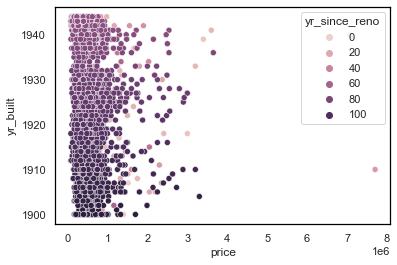

In [52]:
sns.scatterplot(data=old(df), x="price", y="yr_built",hue="yr_since_reno")

<AxesSubplot:xlabel='price', ylabel='yr_since_reno'>

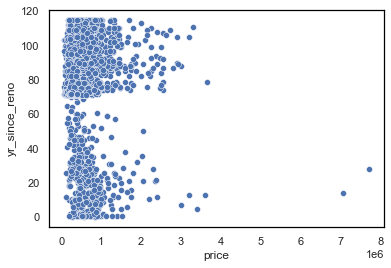

In [53]:
sns.scatterplot(data=old(df), x="price", y="yr_since_reno")

<AxesSubplot:xlabel='price', ylabel='yr_built'>

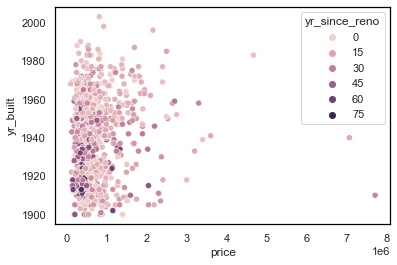

In [54]:
sns.scatterplot(data=renovated(df), x="price", y="yr_built" ,hue="yr_since_reno")

<AxesSubplot:xlabel='price', ylabel='yr_built'>

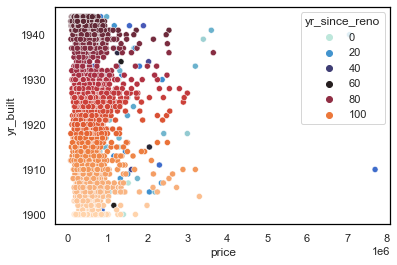

In [55]:
sns.scatterplot(data=old(df), x="price", y="yr_built" ,hue="yr_since_reno", palette="icefire")

<AxesSubplot:xlabel='yr_built', ylabel='relative_price_win'>

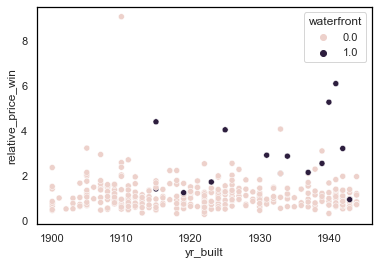

In [56]:
sns.scatterplot(data=renovated(old(df)), x="yr_built", y="relative_price_win", hue="waterfront")

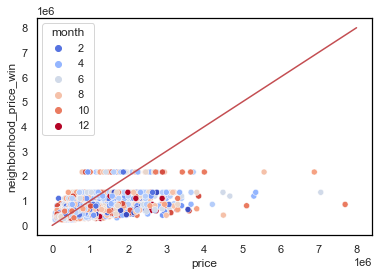

In [57]:
plot= sns.scatterplot(data=df, x="price", y="neighborhood_price_win", hue="month", palette="coolwarm")
X_plot = np.linspace(0, 8e6, 100)
Y_plot = np.linspace(0, 8e6, 100)
plt.plot(X_plot, Y_plot, color='r')

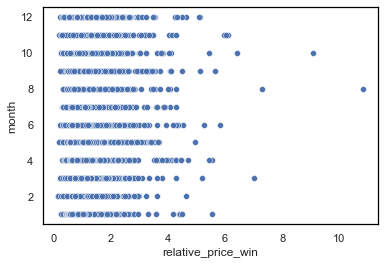

In [58]:
plot= sns.scatterplot(data=df, x="relative_price_win", y="month", palette="coolwarm")

In [59]:
df.groupby("month").mean().sort_values("relative_price_win", ascending = False).relative_price_win

month
4    1.058
3    1.018
6    1.011
5    1.006
12   1.005
1    1.005
7    0.999
10   0.997
8    0.995
9    0.988
2    0.985
11   0.984
Name: relative_price_win, dtype: float64

In [60]:
#sns.pairplot(data= df[["price", "yr_since_reno", "neighborhood_price"]]) 

In [61]:
#sns.pairplot(data= renovated(old(df))[["price", "yr_since_reno", "neighborhood_price"]]) 

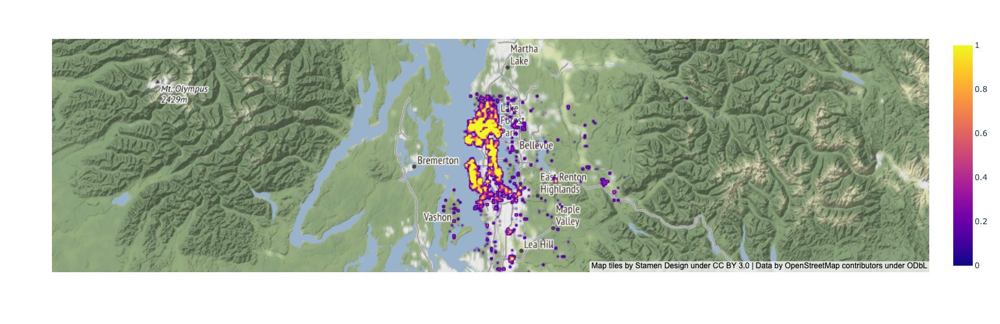

In [62]:
locations = px.density_mapbox(old(df,1950), lat="lat", lon = "long", mapbox_style ="stamen-terrain", zoom =8, radius=2, width = 800, height=500)
locations.show()

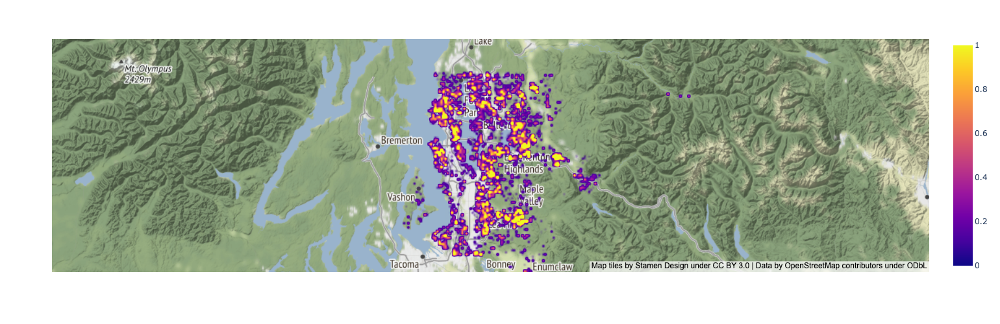

In [63]:
locations = px.density_mapbox(new(df, 1980), lat="lat", lon = "long", mapbox_style ="stamen-terrain", zoom =8, radius=2, width = 800, height=500)
locations.show()

<AxesSubplot:xlabel='yr_built', ylabel='relative_price_win'>

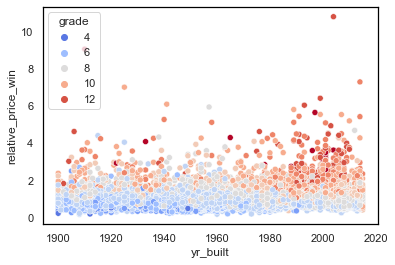

In [64]:
sns.scatterplot(data=df, x="yr_built", y="relative_price_win", hue="grade", palette="coolwarm")

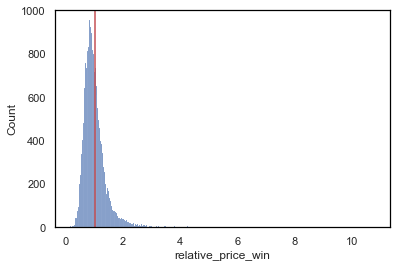

In [65]:
sns.histplot(df["relative_price_win"])
plt.axvline(1, color="r")

<AxesSubplot:xlabel='relative_size', ylabel='Count'>

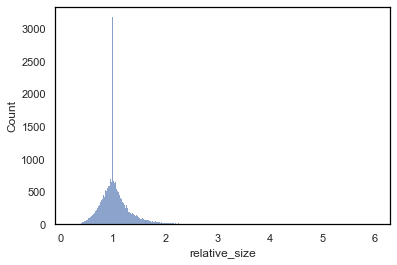

In [66]:
sns.histplot(df["relative_size"], bins = 300)
#plt.axvline(1, color="r")

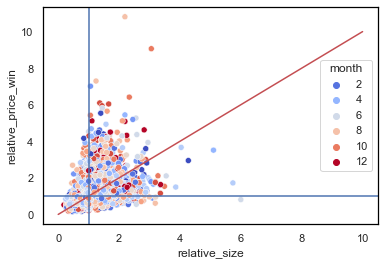

In [67]:
sns.scatterplot(data=df, x="relative_size", y="relative_price_win", hue="month", palette="coolwarm")
X_plot = np.linspace(0, 10, 2)
Y_plot = np.linspace(0, 10, 2)
plt.plot(X_plot, Y_plot, color='r')
plt.axhline(1)
plt.axvline(1)


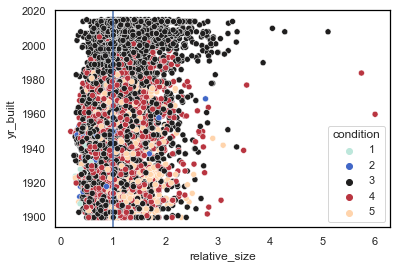

In [68]:
sns.scatterplot(data=df, x="relative_size", y="yr_built", hue="condition", palette="icefire")
plt.axvline(1)

In [69]:
df["sqft_living"].describe()

count   21597.000
mean     2080.322
std       918.106
min       370.000
25%      1430.000
50%      1910.000
75%      2550.000
max     13540.000
Name: sqft_living, dtype: float64

In [70]:
df["sqft_living15"].describe()

count   21597.000
mean     1986.620
std       685.230
min       399.000
25%      1490.000
50%      1840.000
75%      2360.000
max      6210.000
Name: sqft_living15, dtype: float64

<AxesSubplot:xlabel='condition', ylabel='relative_price_win'>

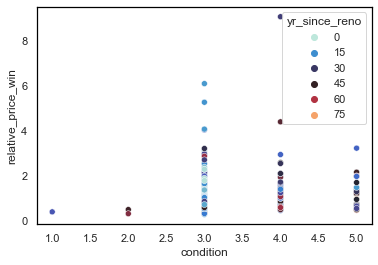

In [71]:
sns.scatterplot(data=renovated(old(df)), x="condition", hue="yr_since_reno",  y="relative_price_win", palette="icefire")

<AxesSubplot:xlabel='condition', ylabel='relative_price_win'>

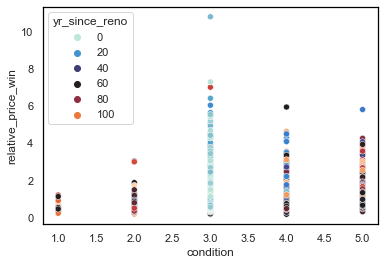

In [73]:
def not_renovated(dataframe):
    return dataframe[dataframe["yr_renovated"] == 0]

sns.scatterplot(data=not_renovated(df), x="condition", y="relative_price_win",  hue="yr_since_reno", palette="icefire")

### Future plans
- Bin by size, age (condition)
- Refine "relative prize" by comparing only houses in the same bin (condition +-1)

- Sort by relative difference to neighborhood
- Make geological neighborhood bins

- Plot impact of renovating (last x years), old vs new houses

Interesting findings:
- many houses are the exact same size than their 15 neighbors

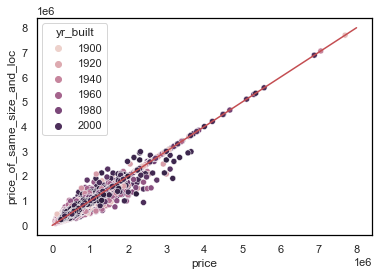

In [74]:
sns.scatterplot(data=df, x="price", y="price_of_same_size_and_loc", hue="yr_built")
X_plot = np.linspace(0, 8e6, 2)
Y_plot = np.linspace(0, 8e6, 2)
plt.plot(X_plot, Y_plot, color='r')

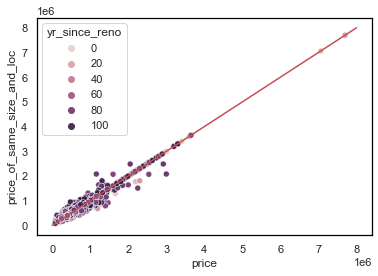

In [75]:
sns.scatterplot(data=old(df), x="price", y="price_of_same_size_and_loc", hue="yr_since_reno")
X_plot = np.linspace(0, 8e6, 2)
Y_plot = np.linspace(0, 8e6, 2)
plt.plot(X_plot, Y_plot, color='r')

Plots to show:
barplot: relative market price of old houses, divided by years since renovation

Recommendations:

look there for old houses
best to buy/sell old houses with size = x or higher/smaller
renovate if has been more than x years, because renovation is more valuable in old houses?
or: don't renovate: because houses in original state are worth more (if condition is good)


In [76]:
df["price_of_same_size_and_loc"] = df.groupby(["zipcode","sqft_living_bin"])["price"].transform("mean")
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,price_bin,sqft_living_bin,yr_built_bin,price_of_same_size_and_loc,relative_size,neighborhood_price_win,relative_price_win,relative_price_bin,yr_since_reno,yr_since_reno_bin
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,443500.000,2271.500,1945.500,655383.040,1.521,465698.939,1.155,1.000,24.000,20
35,9547205180,2014-06-13,696000.000,3,2.500,2300,3060,1.500,0.000,0.000,...,443500.000,2271.500,1928.250,780637.157,1.447,617182.571,1.128,1.034,13.000,10
95,1483300570,2014-09-08,905000.000,4,2.500,3300,10250,1.000,0.000,0.000,...,824600.000,2930.000,1945.500,1257206.174,1.692,1186823.993,0.763,1.000,24.000,20
103,2450000295,2014-10-07,1090000.000,3,2.500,2920,8113,2.000,0.000,0.000,...,824600.000,2271.500,1945.500,1127828.254,1.232,1339173.833,0.814,0.877,5.000,0
125,4389200955,2015-03-02,1450000.000,4,2.750,2750,17789,1.500,0.000,0.000,...,1205700.000,2271.500,1911.000,1127828.254,0.899,1339173.833,1.083,1.000,23.000,20


## Impact of renovation on relative house prices:
recent renovation = 10 years

In [77]:
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,price_bin,sqft_living_bin,yr_built_bin,price_of_same_size_and_loc,relative_size,neighborhood_price_win,relative_price_win,relative_price_bin,yr_since_reno,yr_since_reno_bin
1,6414100192,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0.000,0.000,...,443500.000,2271.500,1945.500,655383.040,1.521,465698.939,1.155,1.000,24.000,20
35,9547205180,2014-06-13,696000.000,3,2.500,2300,3060,1.500,0.000,0.000,...,443500.000,2271.500,1928.250,780637.157,1.447,617182.571,1.128,1.034,13.000,10
95,1483300570,2014-09-08,905000.000,4,2.500,3300,10250,1.000,0.000,0.000,...,824600.000,2930.000,1945.500,1257206.174,1.692,1186823.993,0.763,1.000,24.000,20
103,2450000295,2014-10-07,1090000.000,3,2.500,2920,8113,2.000,0.000,0.000,...,824600.000,2271.500,1945.500,1127828.254,1.232,1339173.833,0.814,0.877,5.000,0
125,4389200955,2015-03-02,1450000.000,4,2.750,2750,17789,1.500,0.000,0.000,...,1205700.000,2271.500,1911.000,1127828.254,0.899,1339173.833,1.083,1.000,23.000,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21576,1931300412,2015-04-16,475000.000,3,2.250,1190,1200,3.000,0.000,0.000,...,443500.000,954.500,2003.000,496084.744,1.008,583570.374,0.814,1.020,NaN,NaN
21577,8672200110,2015-03-17,1090000.000,5,3.750,4170,8142,2.000,0.000,2.000,...,824600.000,3588.500,2003.000,754054.167,1.376,411117.150,2.651,1.000,NaN,NaN
21579,1972201967,2014-10-31,520000.000,2,2.250,1530,981,3.000,0.000,0.000,...,443500.000,954.500,2003.000,496084.744,1.000,583570.374,0.891,1.128,NaN,NaN
21581,191100405,2015-04-21,1580000.000,4,3.250,3410,10125,2.000,0.000,0.000,...,1205700.000,2930.000,2003.000,1257206.174,1.489,1186823.993,1.331,1.000,NaN,NaN


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, '0'),
  Text(1, 0, '10'),
  Text(2, 0, '20'),
  Text(3, 0, '30'),
  Text(4, 0, '40'),
  Text(5, 0, '50'),
  Text(6, 0, '60'),
  Text(7, 0, '70'),
  Text(8, 0, '80'),
  Text(9, 0, '90'),
  Text(10, 0, '100'),
  Text(11, 0, '110')])

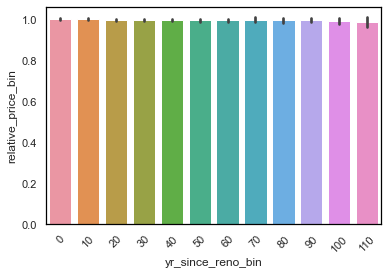

In [78]:
sns.barplot(data=df, x="yr_since_reno_bin", y="relative_price_bin")
plt.xticks(rotation=45)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, '0'),
  Text(1, 0, '10'),
  Text(2, 0, '20'),
  Text(3, 0, '30'),
  Text(4, 0, '40'),
  Text(5, 0, '50'),
  Text(6, 0, '60'),
  Text(7, 0, '70'),
  Text(8, 0, '80'),
  Text(9, 0, '90'),
  Text(10, 0, '100'),
  Text(11, 0, '110')])

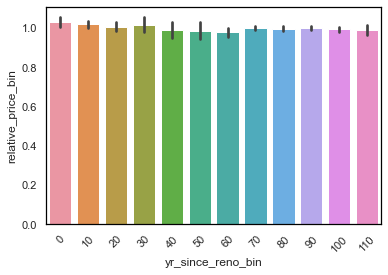

In [79]:
sns.barplot(data=old(df), x="yr_since_reno_bin", y="relative_price_bin")
plt.xticks(rotation=45)

<AxesSubplot:xlabel='yr_since_reno_bin', ylabel='relative_price_win'>

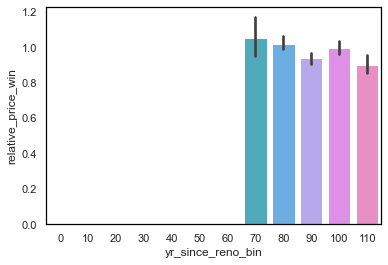

In [80]:
sns.barplot(data=not_renovated(old(df, 1939)), x="yr_since_reno_bin", y="relative_price_win")

<AxesSubplot:xlabel='yr_since_reno_bin', ylabel='relative_price_win'>

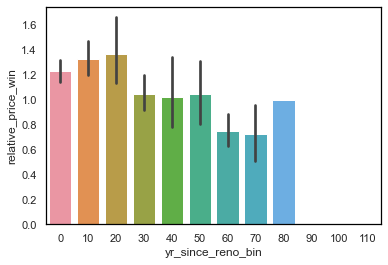

In [81]:
sns.barplot(data=renovated(old(df, 1939)), x="yr_since_reno_bin", y="relative_price_win")

In [101]:
reno_impact_all = df.groupby("yr_since_reno_bin").mean()[["relative_price_win", "price"]]
reno_impact_new = new(df,1939).groupby("yr_since_reno_bin").mean()[["relative_price_win", "price"]]
reno_impact_old = old(df, 1939).groupby("yr_since_reno_bin").mean()[["relative_price_win", "price"]]

In [86]:
#df.groupby("yr_since_reno_bin").mean().relative_price_bin
#old(df).groupby("yr_since_reno_bin").mean().relative_price_bin

In [103]:
reno_impact_new.join(reno_impact_old, rsuffix="_old", lsuffix="_new", on="yr_since_reno_bin")

,relative_price_win_new,price_new,relative_price_win_old,price_old
yr_since_reno_bin,,,,
0,1.135,626744.292,1.224,734767.000
10,1.147,627883.205,1.321,876950.606
20,1.077,553880.375,1.363,852647.746
30,0.956,494379.454,1.041,602208.974
40,0.888,457321.344,1.018,537648.269
50,0.894,447470.839,1.046,507875.238
60,0.875,457713.684,0.747,414711.111
70,0.842,417065.171,1.045,585566.992
80,NaN,NaN,1.020,606797.131


ValueError: Could not interpret input 'relative_price_win_new'

yr_since_reno_bin
0     1.138
10    1.152
20    1.087
30    0.957
40    0.890
50    0.896
60    0.875
70    0.874
80    1.020
90    0.937
100   0.995
110   0.901
Name: relative_price_win, dtype: float64